# questions:
- GAMMA
    - O gamma é um parametro de brilho da imagem. Elevar os canais de um pixel ao quadrado - por exemplo - aproxima sua cor de preto (escuro total);
- FILTER2D() PARAM -1
    
- kernel,
- ksize,
- Gaussian blur (de que é a media, como esta aplicando), (o que é o 10?)



# Blurring and Smoothing

There are a lot of different effects and filters we can apply to images. We're just going to go through a few of them here. Most of them involve some sort of math based function being applied to all the pixels values.


-----
#### Info Link on Blurring Math:

http://people.csail.mit.edu/sparis/bf_course/

------

## Convenience Functions

Quick function for loading the puppy image.

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [19]:
def load_img():
    img = cv2.imread('bricks.jpg').astype(np.float32) / 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [4]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

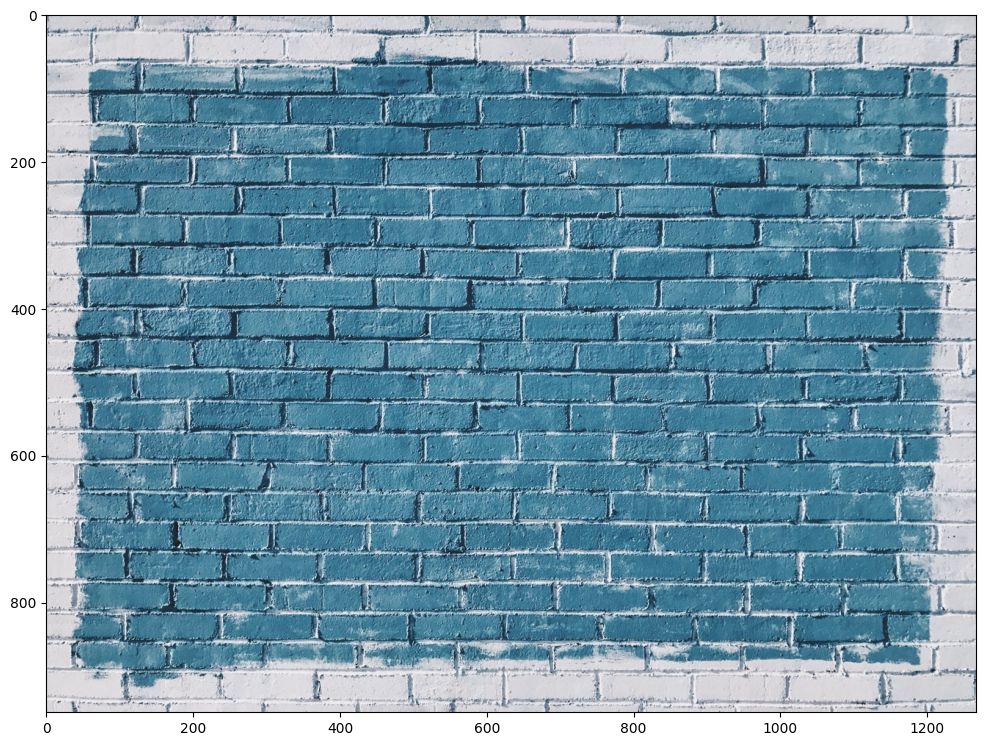

In [5]:
i = load_img()
display_img(i)

-------

### Gamma Correction : Practical Effect of Increasing Brightness

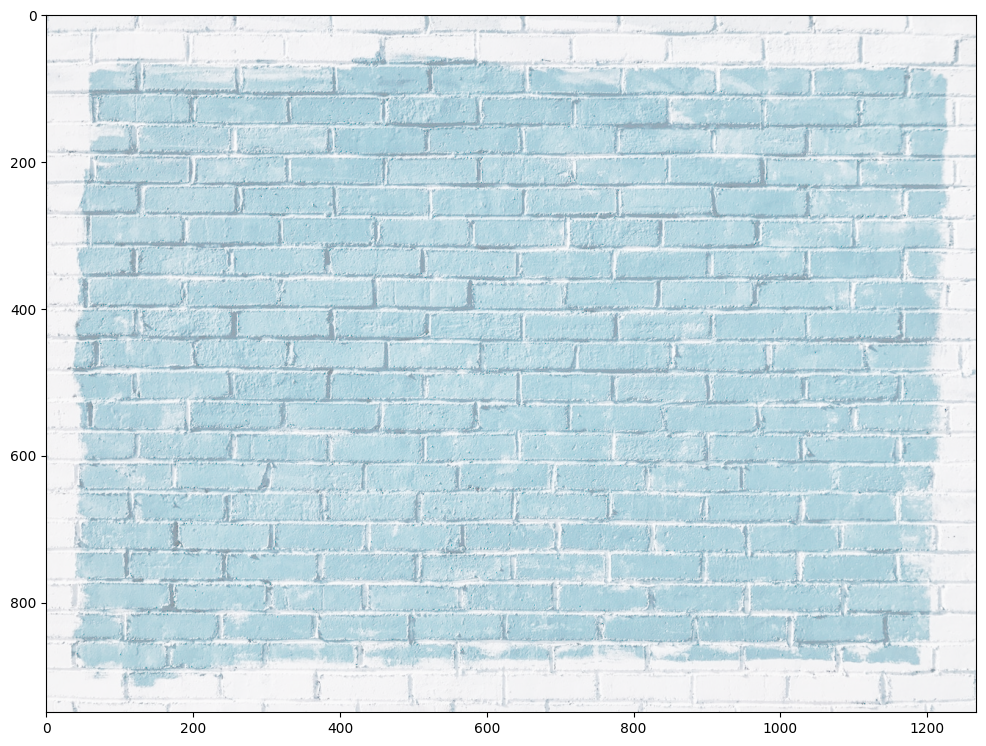

In [6]:
img = load_img()
gamma = 1/4
effected_image = np.power(img, gamma)
display_img(effected_image)

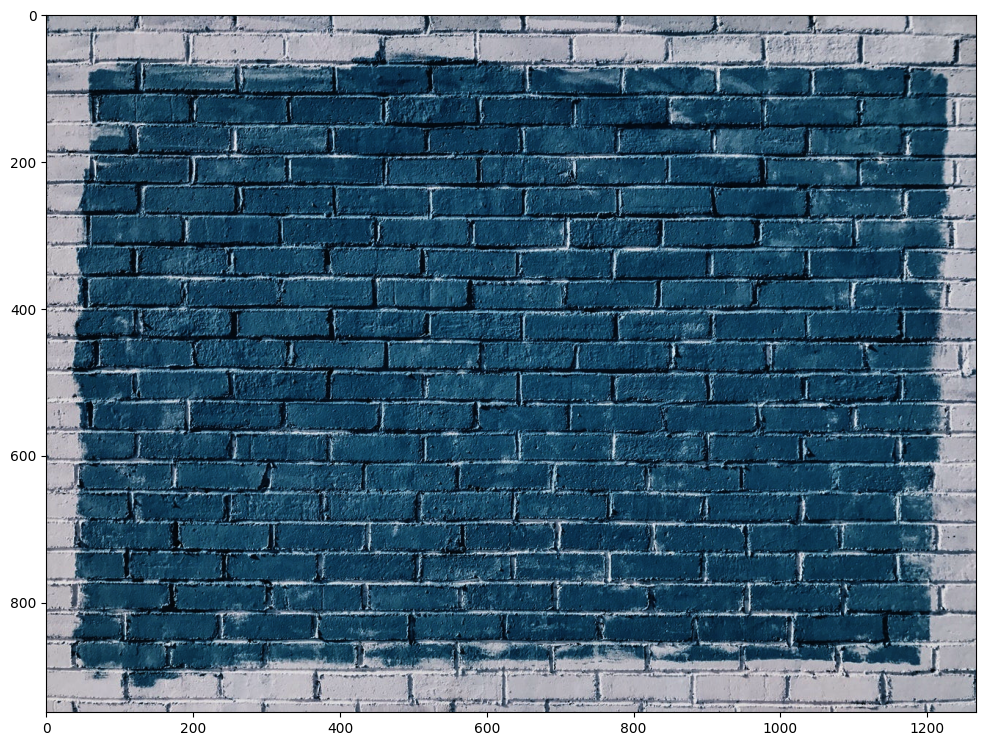

In [8]:
img = load_img()
gamma = 2
effected_image = np.power(img, gamma)
display_img(effected_image)

### Low Pass Filter with a 2D Convolution

A fitlering operation known as 2D convolution can be used to create a low-pass filter. Make sure to view the video for an explanation of what's happening in the code below.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


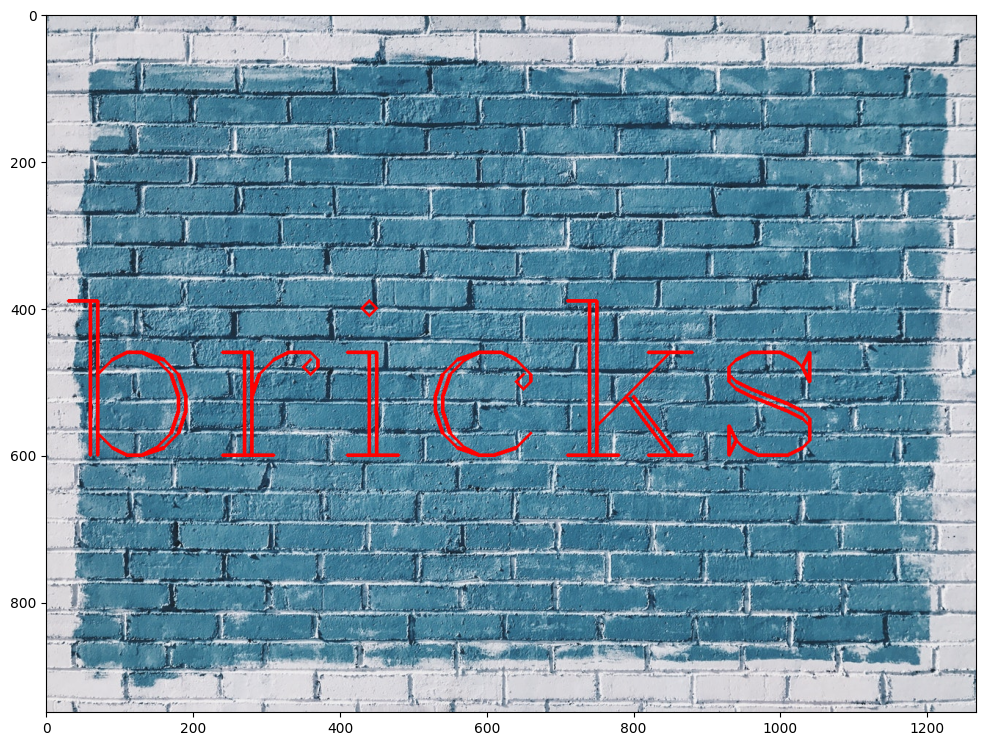

In [9]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

### Create the Kernel

In [10]:
kernel = np.ones(shape=(5,5),dtype=np.float32)/25

In [11]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..254.99995].


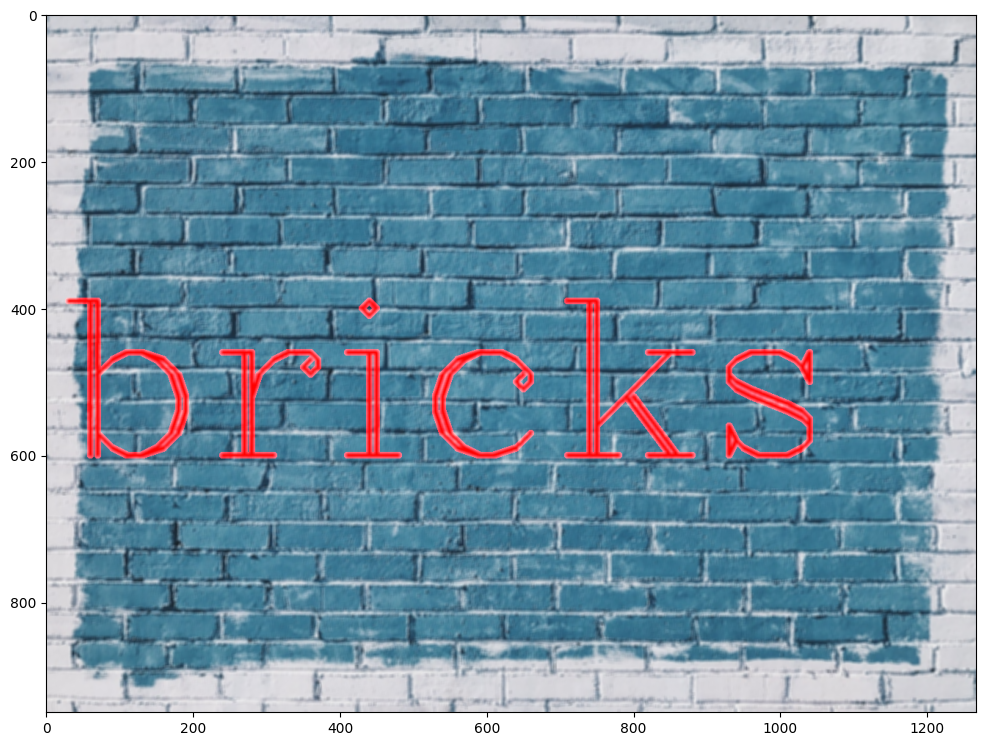

In [22]:
dst = cv2.filter2D(img,-1,kernel)
display_img(dst)

## Averaging

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


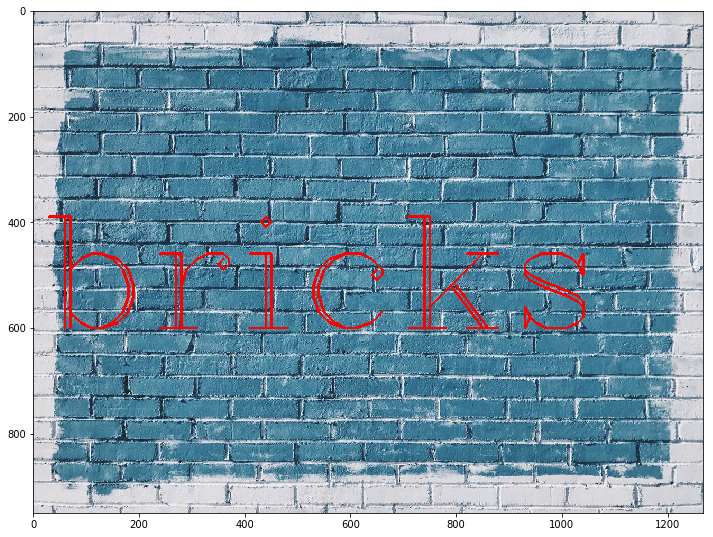

In [12]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

In [13]:
blurred_img = cv2.blur(img,ksize=(5,5))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


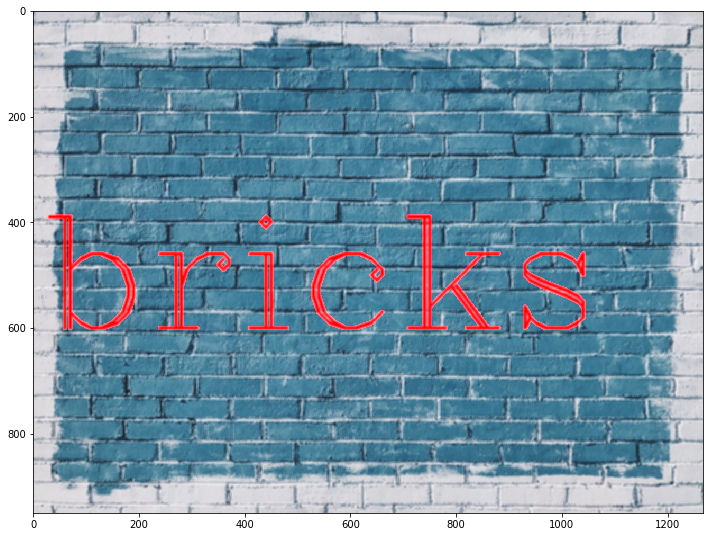

In [14]:
display_img(blurred_img)

## Gaussian Blurring

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


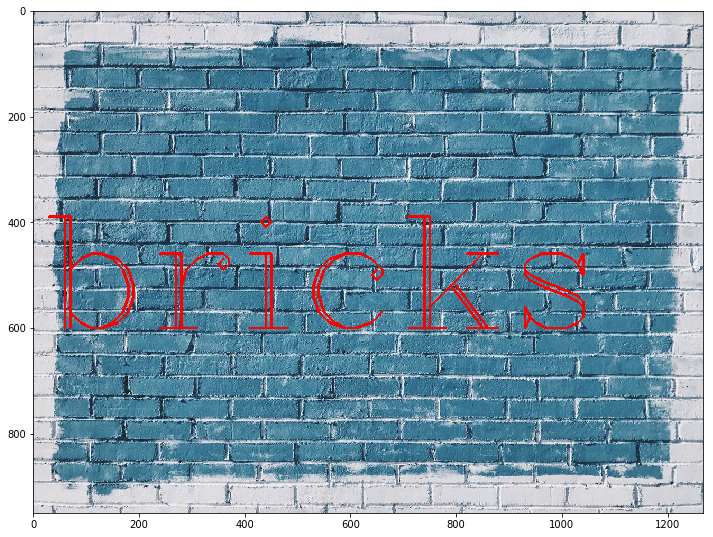

In [15]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


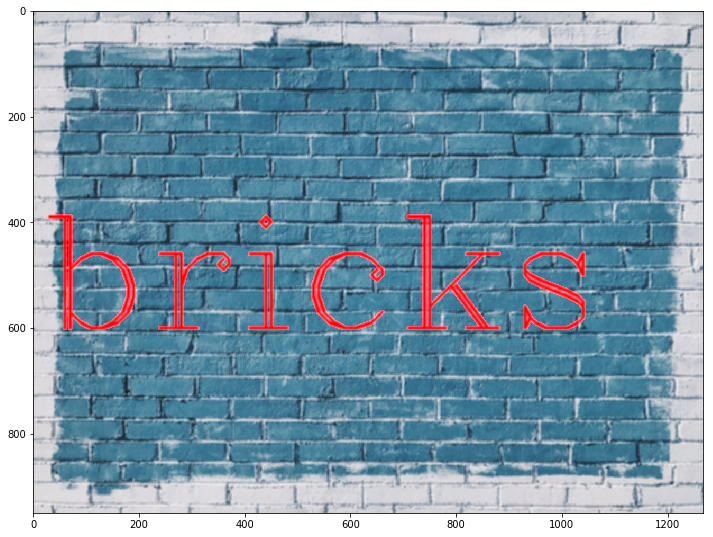

In [16]:
blurred_img = cv2.GaussianBlur(img,(5,5),10)
display_img(blurred_img)

## Median Blurring

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


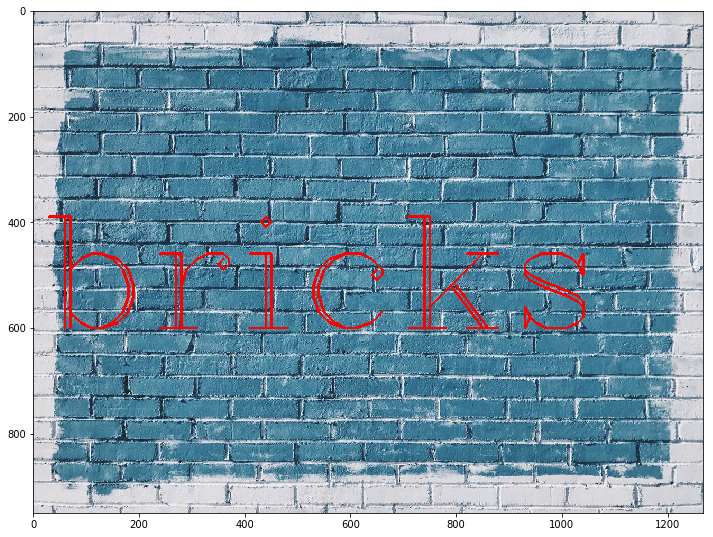

In [17]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


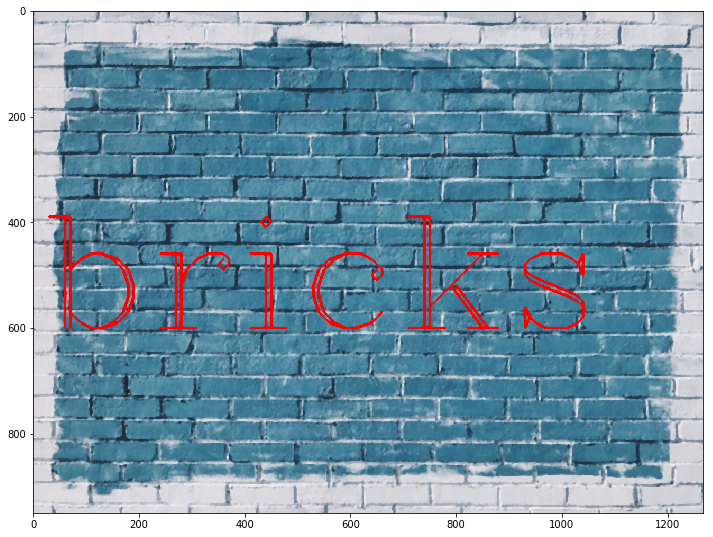

In [18]:
median = cv2.medianBlur(img,5)
display_img(median)

----------
### Adding Noise

Let's see a more useful case of Median Blurring by adding some random noise to an image.

In [19]:
img = cv2.imread('../DATA/sammy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [20]:
img.max()

255

In [21]:
img.min()

0

In [22]:
img.mean()

89.33082543817392

In [23]:
img.shape

(1367, 1025, 3)

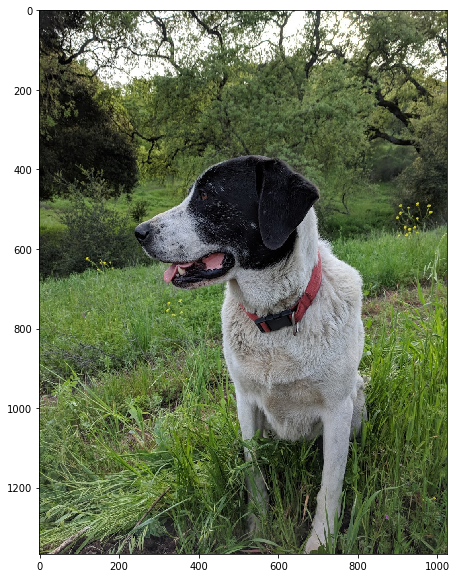

In [24]:
display_img(img)

In [25]:
noise_img = cv2.imread('../DATA/sammy_noise.jpg')

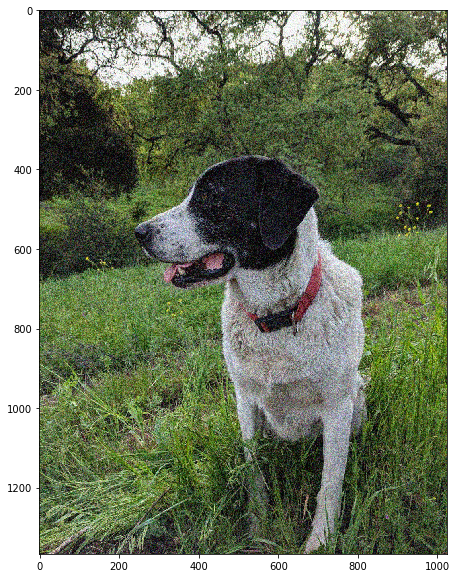

In [26]:
display_img(noise_img)

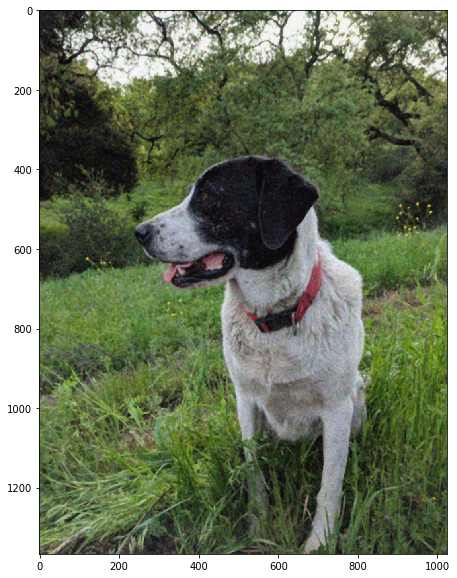

In [27]:
median = cv2.medianBlur(noise_img,5)
display_img(median)

--------

## Bilateral Filtering

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


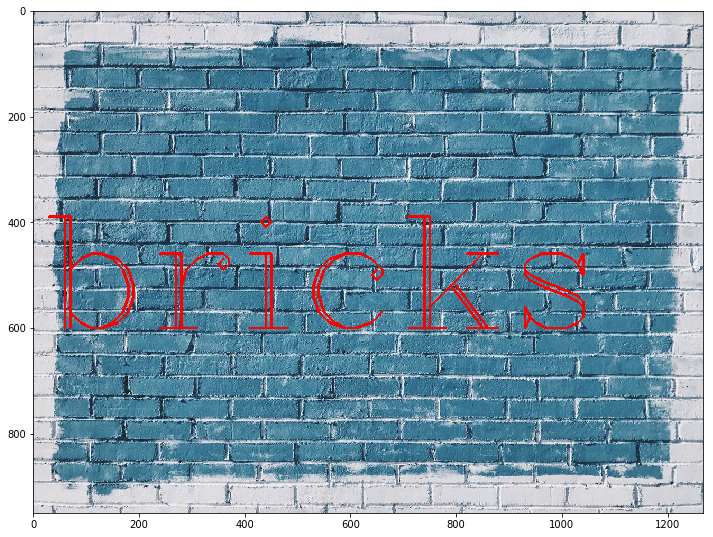

In [28]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

In [29]:
blur = cv2.bilateralFilter(img,9,75,75)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


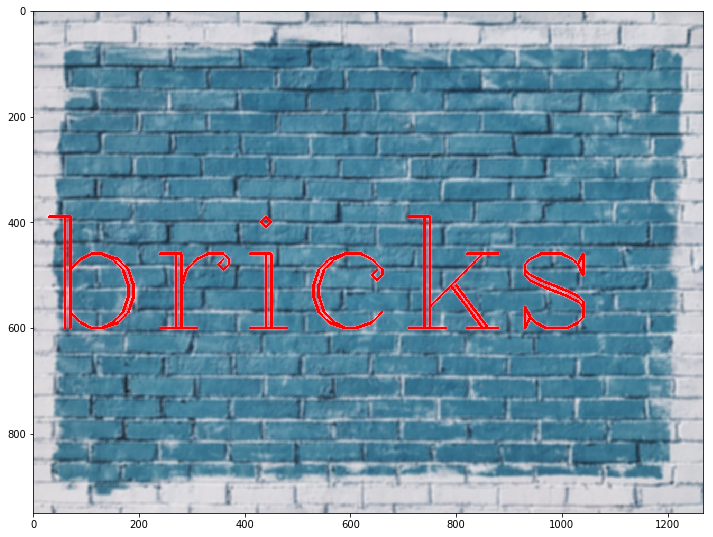

In [30]:
display_img(blur)

## Great Work! Hopefully now you could imagine how software like PhotoShop or Google Images works!